#### This code reproduces the findings of the following scientific article, accepted for publication in npj Materials Degradation journal on 25 September 2023:
### Estimating pitting descriptors of 316L stainless steel by machine learning and statistical analysis
#### _Leonardo Bertolucci Coelho$^{1,2,*}$, Daniel Torres$^{1}$, Vincent Vangrunderbeek$^{2}$, Miguel Bernal$^{1}$, Gian Marco Paldino$^{3}$, Gianluca Bontempi$^{3}$, Jon Ustarroz$^{1,2}$_ 

_$^{1}$ChemSIN – Chemistry of Surfaces, Interfaces and Nanomaterials, Université libre de Bruxelles (ULB), Brussels, Belgium_ 

_$^{2}$Research Group Electrochemical and Surface Engineering (SURF), Vrije Universiteit Brussel, Brussels, Belgium_

_$^{3}$Machine Learning Group (MLG), Université libre de Bruxelles (ULB), Brussels, Belgium_

_*leonardo.bertolucci.coelho@ulb.be_

# 0.01 M NaCl, 100 mV/s

In [26]:
# Import the required libraries
import os
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns

import sklearn
from scipy.stats import kde
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import warnings
from sklearn import metrics
from sklearn.metrics import r2_score

### datasets uploaded below can be downloaded at: https://data.mendeley.com/datasets/78rz8vw46x/2
Bertolucci Coelho, Leonardo (2023), “Micro-scale potentiodynamic polarisation curves of 316L stainless steel ”, Mendeley Data, V2, doi: 10.17632/78rz8vw46x.2

In [27]:
# choosing the directory for uploading the datasets
os.chdir(r"C:\Users\lbertolu\OneDrive - Vrije Universiteit Brussel\ULB\SECCM tests\pitting statistics paper draft\paper1")

# getting the current directory
%pwd

'C:\\Users\\lbertolu\\OneDrive - Vrije Universiteit Brussel\\ULB\\SECCM tests\\pitting statistics paper draft\\paper1'

In [28]:
df_001_100_E=pd.read_csv('E(V)_0.01_M_NaCl_100_mV_per_s.csv') 
E=df_001_100_E["E (V)"]
E

0       0.500198
1       0.501114
2       0.501724
3       0.502640
4       0.503250
          ...   
1103    1.350749
1104    1.351360
1105    1.352275
1106    1.352885
1107    1.353801
Name: E (V), Length: 1108, dtype: float64

In [29]:
df_001_100=pd.read_csv('j_uA-cm2_0.01_M_NaCl_100_mV_per_s.csv') 
df_001_100

,0,1,2,3,4,5,6,7,8,9,...,367,368,369,370,371,372,373,374,375,376
0,126.286465,165.143842,184.572516,194.286859,145.715152,165.143842,145.715152,145.715152,136.000808,165.143842,...,165.143842,155.429498,155.429498,145.715152,126.286465,174.858185,165.143842,184.572516,155.429498,165.143842
1,155.429498,126.286465,126.286465,233.144239,136.000808,126.286465,145.715152,165.143842,145.715152,136.000808,...,136.000808,174.858185,145.715152,165.143842,184.572516,136.000808,155.429498,155.429498,155.429498,116.572118
2,145.715152,174.858185,145.715152,262.287257,136.000808,174.858185,145.715152,116.572118,136.000808,126.286465,...,155.429498,136.000808,165.143842,165.143842,136.000808,145.715152,174.858185,155.429498,165.143842,165.143842
3,155.429498,136.000808,155.429498,184.572516,155.429498,126.286465,155.429498,136.000808,165.143842,136.000808,...,155.429498,145.715152,145.715152,184.572516,204.001206,155.429498,136.000808,155.429498,194.286859,136.000808
4,165.143842,145.715152,145.715152,204.001206,136.000808,136.000808,116.572118,136.000808,126.286465,145.715152,...,136.000808,165.143842,184.572516,136.000808,126.286465,204.001206,145.715152,145.715152,116.572118,194.286859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1103,6673.753829,6732.039870,6761.183050,49222.578180,7353.757965,8072.618826,8198.905409,8004.618604,8014.333421,8140.620004,...,6945.755356,7276.043243,7412.044007,7674.331353,7431.473006,7208.043021,7072.041939,6498.895704,6460.038343,5576.033220
1104,6819.468773,6906.898313,6693.182827,49756.864507,7470.329730,8373.763534,8402.907032,7926.904518,8150.333867,8072.618826,...,7072.041939,7188.614022,7674.331353,7761.760256,7421.758188,7373.186646,7305.186423,6440.609662,6547.467246,5634.318943
1105,6877.755133,7033.184577,6702.897009,51184.875867,7616.044993,8364.049671,8616.622836,7946.333199,8490.336253,8169.762547,...,7198.328521,7363.472146,7771.474119,8062.904964,7713.188714,7431.473006,7314.900286,6469.752842,6829.183273,5760.605526
1106,7130.327980,6936.040857,6868.040634,53118.029102,7664.616535,8373.763534,8713.765602,8140.620004,8432.049893,8412.620895,...,7198.328521,7285.757424,8189.191546,8121.191323,7888.046839,7781.188937,7470.329730,6722.325371,6829.183273,5964.606830


In [30]:
df_001_100_log=np.log10(df_001_100)

### exporting the log(j) curves as a CSV file

In [58]:
os.chdir(r"C:\Users\lbertolu\OneDrive - Vrije Universiteit Brussel\ULB\SECCM tests\pitting statistics paper draft\pape2")

df_001_100_log.to_csv('logj_uA-cm2_0.01_M_NaCl_100_mV_per_s.csv', index=False)

#### dataset exported above is permanently stored at: https://data.mendeley.com/datasets/7j6b6y48jw/1
Bertolucci Coelho, Leonardo; Ustarroz, Jon (2023), “Micro-scale potentiodynamic polarisation (log(j)) curves of 316L stainless steel”, Mendeley Data, V1, doi: 10.17632/7j6b6y48jw.1

In [33]:
df_001_100_log.columns= df_001_100_log.columns.astype(int) # converting to int the str cols (Maps) 

### plotting the raw and smoothed log(j) Vs E curves

<ipython-input-7-e810955cf110>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


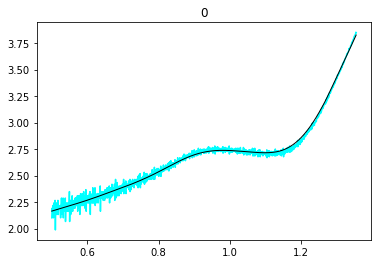

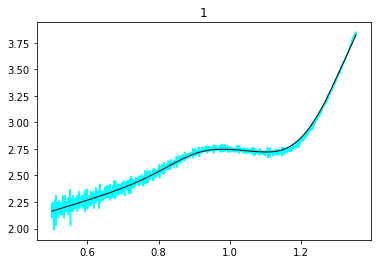

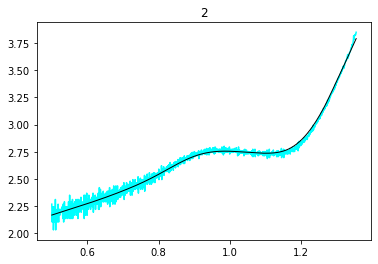

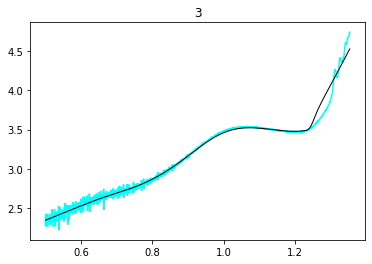

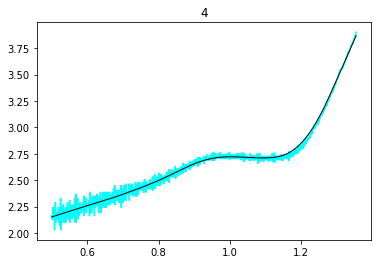

...

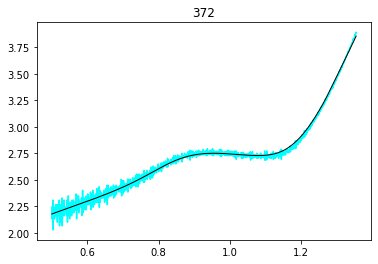

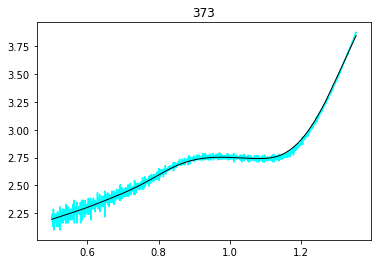

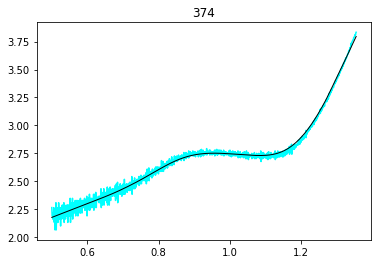

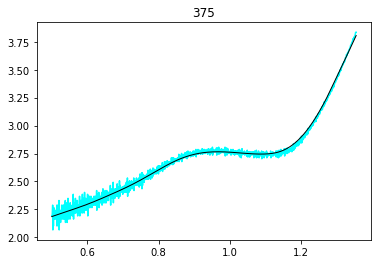

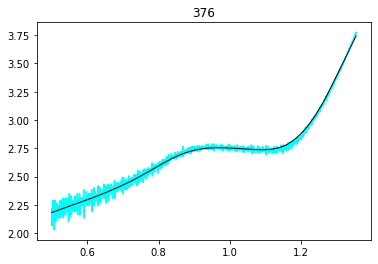

In [7]:
column_names =  df_001_100_log.columns
for index, column in enumerate(column_names):
    fig, ax = plt.subplots() 
    
    lowess = sm.nonparametric.lowess
    ylow = lowess(df_001_100_log[column],E,frac= 0.2,return_sorted=False)

    ax.plot(E , df_001_100_log[column], color = "cyan")
    ax.plot(E , ylow, linewidth = 1, color = "black")
    ax.set_title(column)

### storing the smoothed log(j) in a df

In [48]:
df_ylow_log = df_001_100_log.copy()

column_names =  df_001_100_log.columns
for index, column in enumerate(column_names):
        
    lowess = sm.nonparametric.lowess
    ylow = lowess(df_001_100_log[column],E,frac= 0.15,return_sorted=False)
    df_ylow_log[column]=ylow
    
df_ylow_log

,0,1,2,3,4,5,6,7,8,9,...,367,368,369,370,371,372,373,374,375,376
0,2.169471,2.160029,2.169182,2.342455,2.149868,2.148475,2.160848,2.156363,2.147503,2.137631,...,2.194855,2.182655,2.194069,2.197578,2.183628,2.173316,2.202800,2.173520,2.190451,2.182737
1,2.170281,2.160967,2.170106,2.344173,2.150918,2.149553,2.161596,2.157279,2.148678,2.138736,...,2.195791,2.183872,2.194999,2.198579,2.184684,2.174499,2.203619,2.174702,2.191344,2.183758
2,2.170821,2.161593,2.170722,2.345317,2.151618,2.150272,2.162095,2.157889,2.149461,2.139472,...,2.196416,2.184684,2.195619,2.199247,2.185389,2.175288,2.204165,2.175491,2.191939,2.184440
3,2.171631,2.162531,2.171646,2.347032,2.152668,2.151349,2.162843,2.158803,2.150634,2.140576,...,2.197352,2.185900,2.196550,2.200248,2.186445,2.176470,2.204984,2.176675,2.192831,2.185462
4,2.172171,2.163158,2.172261,2.348175,2.153368,2.152067,2.163343,2.159412,2.151416,2.141312,...,2.197976,2.186711,2.197170,2.200916,2.187149,2.177259,2.205530,2.177464,2.193426,2.186144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1103,3.817170,3.819141,3.788821,4.659009,3.857016,3.899581,3.909589,3.902646,3.901232,3.894701,...,3.821790,3.841179,3.874487,3.865017,3.851018,3.847929,3.837066,3.791223,3.798978,3.738505
1104,3.821865,3.823938,3.793555,4.666199,3.861920,3.904593,3.914590,3.907379,3.906144,3.899654,...,3.826309,3.845703,3.879180,3.869701,3.855665,3.852489,3.841590,3.795680,3.803427,3.742733
1105,3.828910,3.831136,3.800661,4.676989,3.869277,3.912113,3.922092,3.914477,3.913513,3.907085,...,3.833091,3.852491,3.886221,3.876730,3.862638,3.859330,3.848379,3.802370,3.810103,3.749078
1106,3.833609,3.835938,3.805401,4.684185,3.874184,3.917127,3.927096,3.919208,3.918427,3.912042,...,3.837615,3.857018,3.890918,3.881419,3.867289,3.863893,3.852906,3.806832,3.814556,3.753310


# Epit estimation by rule-based linear regression

## definition of classes of log(j) Vs E curves based on their qualitative degree of similarity 

### providing initial guesses for the Epit intervals and the Epass values (for improved accuracy of estimation)

#### optimized combination for the general class
Epit interval=[0.91,1.2]

Epass=0.9 

In [8]:
Epit_interval_lower = float(input(r"Enter a guess value (V) for the lower limit of the Epit interval: ")) #'r' --> a character following a backslash is included in the string without change
Epit_interval_upper = float(input(r"Enter a guess value (V) for the upper limit of the Epit interval: ")) #'r' --> a character following a backslash is included in the string without change
Epass_estimated = float(input(r"Enter a guess value (V) for Epass: ")) 
interval_lower_i=E[E>Epit_interval_lower].dropna().index[0]
interval_upper_i=E[E<Epit_interval_upper].dropna().index[-1]
Epass_estimated_i=E[E<Epass_estimated].dropna().index[-1]
print("Epit guessed interval: "+str(round(E[interval_upper_i]-E[interval_lower_i],3))+" V")
print("Epass estimated: "+str(round(E[Epass_estimated_i],3))+" V")

Enter a guess value (V) for the lower limit of the Epit interval: 0.91
Enter a guess value (V) for the upper limit of the Epit interval: 1.2
Enter a guess value (V) for Epass: 0.9
Epit guessed interval: 0.289 V
Epass estimated: 0.9 V


In [9]:
class2=[301]  # not distinguished by the underlying electrochemical behaviour, but the different curves' shapes require different input intervals for improved computation

#### optimized combination for class2
Epit interval=[1.11,1.15]

Epass=0.9

In [10]:
Epit_interval_lower1 = float(input(r"Enter a guess value (V) for the lower limit of the Epit interval: ")) 
Epit_interval_upper1 = float(input(r"Enter a guess value (V) for the upper limit of the Epit interval: ")) 
Epass_estimated1 = float(input(r"Enter a guess value (V) for Epass: ")) 
interval_lower_i1=E[E>Epit_interval_lower1].dropna().index[0]
interval_upper_i1=E[E<Epit_interval_upper1].dropna().index[-1]
Epass_estimated_i1=E[E<Epass_estimated1].dropna().index[-1]
print("Epit guessed interval: "+str(round(E[interval_upper_i1]-E[interval_lower_i1],3))+" V")
print("Epass estimated: "+str(round(E[Epass_estimated_i1],3))+" V")

Enter a guess value (V) for the lower limit of the Epit interval: 1.11
Enter a guess value (V) for the upper limit of the Epit interval: 1.15
Enter a guess value (V) for Epass: 0.9
Epit guessed interval: 0.039 V
Epass estimated: 0.9 V


In [11]:
high_jpass=[3,14,23,53,62,77,116,117,135,226,227,231,232,233,241,256,260,283,294,301,312,313] # Ipass > 3.3 

#### optimized combination for high_jpass
Epit interval=[1.1,1.25]

Epass=1

In [12]:
Epit_interval_lower2 = float(input(r"Enter a guess value (V) for the lower limit of the Epit interval: ")) 
Epit_interval_upper2 = float(input(r"Enter a guess value (V) for the upper limit of the Epit interval: ")) 
Epass_estimated2 = float(input(r"Enter a guess value (V) for Epass: ")) 
interval_lower_i2=E[E>Epit_interval_lower2].dropna().index[0]
interval_upper_i2=E[E<Epit_interval_upper2].dropna().index[-1]
Epass_estimated_i2=E[E<Epass_estimated2].dropna().index[-1]
print("Epit guessed interval: "+str(round(E[interval_upper_i2]-E[interval_lower_i2],3))+" V")
print("Epass estimated: "+str(round(E[Epass_estimated_i2],3))+" V")

Enter a guess value (V) for the lower limit of the Epit interval: 1.1
Enter a guess value (V) for the upper limit of the Epit interval: 1.25
Enter a guess value (V) for Epass: 1
Epit guessed interval: 0.15 V
Epass estimated: 1.0 V


In [13]:
depression=[302] 

#### optimized combination for depression
Epit interval=[0.89,0.91]

Epass=0.51

In [14]:
Epit_interval_lower3 = float(input(r"Enter a guess value (V) for the lower limit of the Epit interval: ")) 
Epit_interval_upper3 = float(input(r"Enter a guess value (V) for the upper limit of the Epit interval: ")) 
Epass_estimated3 = float(input(r"Enter a guess value (V) for Epass: ")) 
interval_lower_i3=E[E>Epit_interval_lower3].dropna().index[0]
interval_upper_i3=E[E<Epit_interval_upper3].dropna().index[-1]
Epass_estimated_i3=E[E<Epass_estimated3].dropna().index[-1]
print("Epit guessed interval: "+str(round(E[interval_upper_i3]-E[interval_lower_i3],3))+" V")
print("Epass estimated: "+str(round(E[Epass_estimated_i3],3))+" V")

Enter a guess value (V) for the lower limit of the Epit interval: 0.89
Enter a guess value (V) for the upper limit of the Epit interval: 0.91
Enter a guess value (V) for Epass: 0.51
Epit guessed interval: 0.019 V
Epass estimated: 0.509 V


## plotting the Epit (E and log(j) pair values) estimated by linear regression

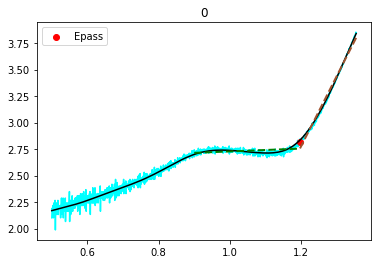

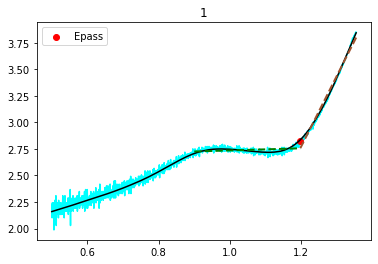

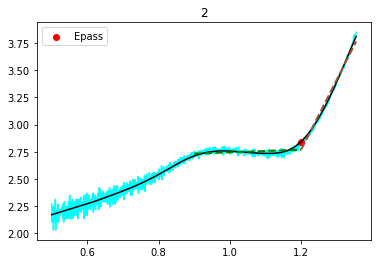

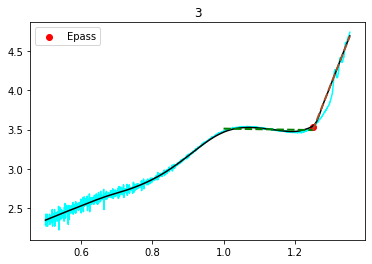

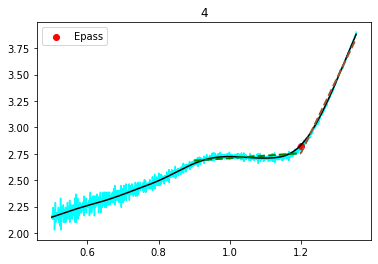

...

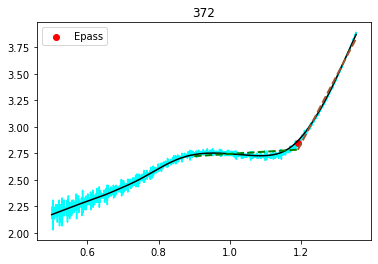

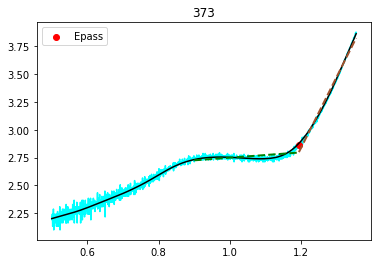

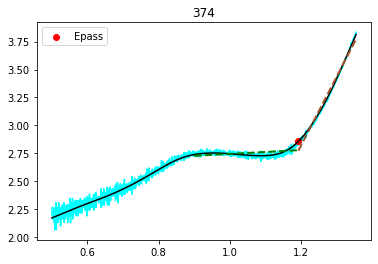

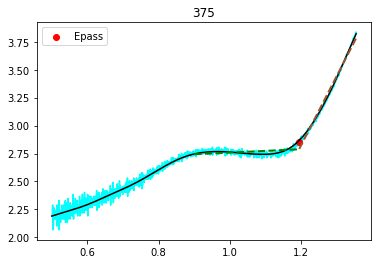

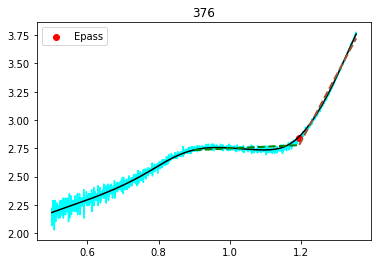

In [15]:
# Avoiding warnings
plt.rcParams.update({'figure.max_open_warning': 0})

column_names = df_ylow_log.columns

# Collect all the slopes and intercepts for the two parts
Epit_E, Epit_j = [], []

# Initialize the two models for part 1 and part 2
model1 = LinearRegression()
model2 = LinearRegression()

for index, column in enumerate(column_names):
    fig, ax = plt.subplots()
    ax.plot(E, df_001_100_log[column], color="cyan", zorder=1)
    ax.set_title(column)

    # Initialize the r2 values
    r2_final1, r2_final2 = 0, 0
    
    # Determine limits based on classes
    if column in class2:
        limits_pit = range(interval_lower_i1, interval_upper_i1+1)
        Epass_estimated = Epass_estimated_i1
    elif column in high_jpass:
        limits_pit = range(interval_lower_i2, interval_upper_i2+1)
        Epass_estimated = Epass_estimated_i2
    elif column in depression:
        limits_pit = range(interval_lower_i3, interval_upper_i3+1)
        Epass_estimated = Epass_estimated_i3
    else:
        limits_pit = range(interval_lower_i, interval_upper_i+1)
        Epass_estimated = Epass_estimated_i

    for limit in limits_pit:
        # Split data for modeling
        X1, X2 = E.iloc[Epass_estimated:limit+1].values.reshape(-1, 1), E.iloc[limit:].values.reshape(-1, 1)
        y1, y2 = df_ylow_log.iloc[Epass_estimated:limit+1][column].values.reshape(-1, 1), df_ylow_log.iloc[limit:][column].values.reshape(-1, 1)

        # Fit models
        regr1, regr2 = model1.fit(X1, y1), model2.fit(X2, y2)

        # Evaluate models
        r2_score1, r2_score2 = r2_score(y1, regr1.predict(X1)), r2_score(y2, regr2.predict(X2))

        # Store best models
        if r2_score1 > r2_final1:
            r2_final1, regr_final1 = r2_score1, regr1
        if r2_score2 > r2_final2:
            r2_final2, regr_final2 = r2_score2, regr2

    # Determine intersection
    a1, a2 = regr_final1.coef_[0], regr_final2.coef_[0]
    b1, b2 = regr_final1.intercept_, regr_final2.intercept_

    x_intersect = np.around((b1-b2) / (a2-a1), 3)
    E_tempo = E.round(3)
    try:
        xi = E_tempo[E_tempo <= x_intersect.item()].index[-1]
    except:
        xi = E_tempo[E_tempo >= x_intersect.item()].index[0]

    try:
        # Plot up to intersection
        ax.plot(E, df_ylow_log[column], color="black", zorder=2)
        x1_reg, x2_reg = E.iloc[Epass_estimated:xi+1], E.iloc[xi:]
        y1_reg, y2_reg = x1_reg * a1 + b1, x2_reg * a2 + b2

        ax.plot(x1_reg, y1_reg, linewidth=2, color='green', linestyle='dashed')
        ax.plot(x2_reg, y2_reg, linewidth=2, color='sienna', linestyle='dashed')
        ax.scatter(E.iloc[xi], np.mean([df_001_100_log[column].iloc[xi], df_ylow_log[column].iloc[xi]]), color="red", label="Epass")
        ax.legend()

        Epit_E.append(E.iloc[xi])
        Epit_j.append(np.mean([df_001_100_log[column].iloc[xi], df_ylow_log[column].iloc[xi]]))
    except:
        print(column)
        Epit_E.append(np.nan)
        Epit_j.append(np.nan)

### storing the Epit (x,y) values in a df

In [16]:
pit_log_001_100 = pd.DataFrame({"Epit_x":Epit_E,"Epit_y":Epit_j})
pit_log_001_100.index=df_001_100_log.columns
pit_log_001_100.index.name="Maps"
pit_log_001_100

,Epit_x,Epit_y
Maps,,
0,1.196325,2.814369
1,1.197241,2.824944
2,1.200293,2.839011
3,1.250343,3.537937
4,1.198767,2.822698
...,...,...
372,1.190222,2.850013
373,1.193274,2.863805
374,1.191748,2.862691


# Epass estimation by rule-based linear regression

### providing initial guesses for the Epass intervals (for improved accuracy of estimation)

#### optimized combination for the general class
Epass interval=[0.7,1]

In [17]:
Epass_interval_lower = float(input(r"Enter a guess value (V) for the lower limit of the Epass interval: ")) 
Epass_interval_upper = float(input(r"Enter a guess value (V) for the upper limit of the Epass interval: "))
interval_lower_ipass=E[E>Epass_interval_lower].dropna().index[0]
interval_upper_ipass=E[E<Epass_interval_upper].dropna().index[-1]
print("Epass guessed interval: "+str(round(E[interval_upper_ipass]-E[interval_lower_ipass],3))+" V")

Enter a guess value (V) for the lower limit of the Epass interval: 0.7
Enter a guess value (V) for the upper limit of the Epass interval: 1
Epass guessed interval: 0.299 V


In [23]:
class1=[23]  # not distinguished by the underlying electrochemical behaviour, but the different curves' shapes require different input intervals for improved computation

#### optimized combination for class1
Epass interval=[0.9,0.95]

In [18]:
Epass_interval_lower1 = float(input(r"Enter a guess value (V) for the lower limit of the Epass interval: ")) 
Epass_interval_upper1 = float(input(r"Enter a guess value (V) for the upper limit of the Epass interval: "))
interval_lower_ipass1=E[E>Epass_interval_lower1].dropna().index[0]
interval_upper_ipass1=E[E<Epass_interval_upper1].dropna().index[-1]
print("Epass guessed interval: "+str(round(E[interval_upper_ipass1]-E[interval_lower_ipass1],3))+" V")

Enter a guess value (V) for the lower limit of the Epass interval: 0.9
Enter a guess value (V) for the upper limit of the Epass interval: 0.95
Epass guessed interval: 0.049 V


#### optimized combination for high_jpass
Epass interval=[0.8,1.08] 

In [19]:
Epass_interval_lower2 = float(input(r"Enter a guess value (V) for the lower limit of the Epass interval: ")) 
Epass_interval_upper2 = float(input(r"Enter a guess value (V) for the upper limit of the Epass interval: ")) 
interval_lower_ipass2=E[E>Epass_interval_lower2].dropna().index[0]
interval_upper_ipass2=E[E<Epass_interval_upper2].dropna().index[-1]
print("Epass guessed interval: "+str(round(E[interval_upper_ipass2]-E[interval_lower_ipass2],3))+" V")

Enter a guess value (V) for the lower limit of the Epass interval: 0.8
Enter a guess value (V) for the upper limit of the Epass interval: 1.08
Epass guessed interval: 0.279 V


In [21]:
pseudo_passivity=[294,301,365]

#### optimized combination for pseudo_passivity
Epass interval=[0.5,0.9] 

In [20]:
Epass_interval_lower3 = float(input(r"Enter a guess value (V) for the lower limit of the Epass interval: ")) 
Epass_interval_upper3 = float(input(r"Enter a guess value (V) for the upper limit of the Epass interval: ")) 
interval_lower_ipass3=E[E>Epass_interval_lower3].dropna().index[0]
interval_upper_ipass3=E[E<Epass_interval_upper3].dropna().index[-1]
print("Epass guessed interval: "+str(round(E[interval_upper_ipass3]-E[interval_lower_ipass3],3))+" V")

Enter a guess value (V) for the lower limit of the Epass interval: 0.5
Enter a guess value (V) for the upper limit of the Epass interval: 0.9
Epass guessed interval: 0.399 V


In [22]:
no_passive_class = [295,302,365] 

## plotting the Epass (E and log(j) pair values) estimated by linear regression

C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.


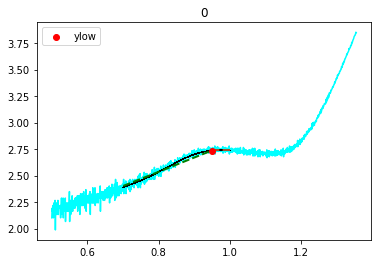

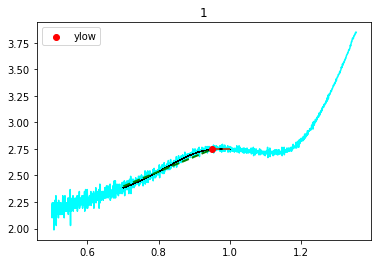

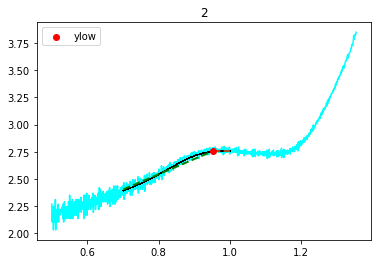

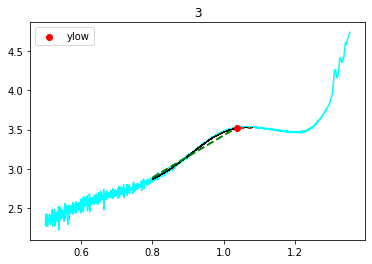

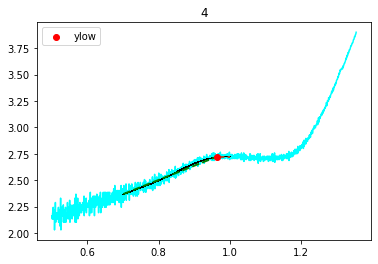

...

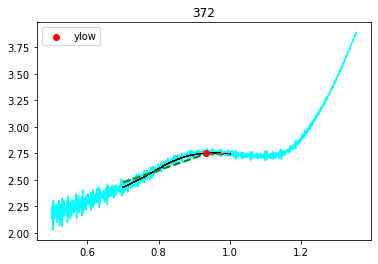

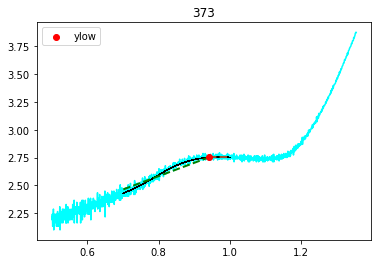

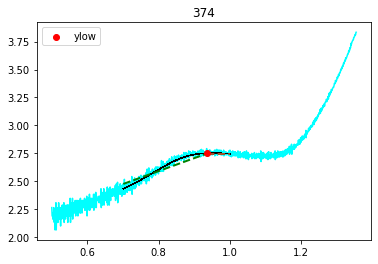

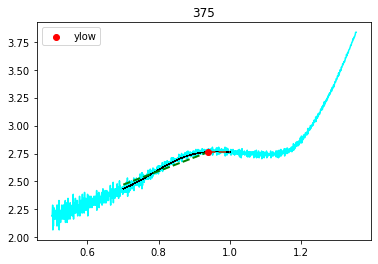

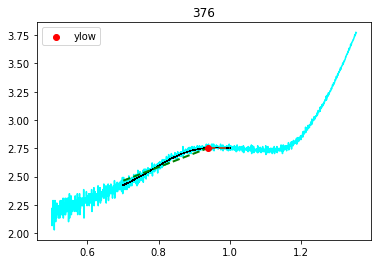

In [24]:
# for avoiding Warnings
plt.rcParams.update({'figure.max_open_warning': 0})

column_names =  df_ylow_log.columns

#collect all of the slopes and intercepts for the two parts
Epass_E, Epass_j = [],[]

#initialise the two models for part 1 and part 2
model1 = LinearRegression()
model2 = LinearRegression()

for (index, column) in enumerate(column_names):
    fig, ax = plt.subplots() 
    
    ax.plot(E , df_001_100_log[column], color = "cyan",zorder=1)

    ax.set_title(column)
    
    # Initialize the r2 values
    r2_final1, r2_final2 = 0, 0
    
    if column in pseudo_passivity: 
        limits_pass = range(interval_lower_ipass3,interval_upper_ipass3+1,1)
        pass
    elif column in class1: 
        limits_pass = range(interval_lower_ipass1,interval_upper_ipass1+1,1)
        pass    
    elif column in high_jpass: 
        limits_pass = range(interval_lower_ipass2,interval_upper_ipass2+1,1) 
        pass
    else:
        limits_pass = range(interval_lower_ipass,interval_upper_ipass+1,1)
        pass
        
    if column not in no_passive_class: # no_passive_class --> no Epass 

        for limit in limits_pass: # ylow 

            ax.plot(E.iloc[limits_pass[0]:limits_pass[-1]+1],df_ylow_log[column].iloc[limits_pass[0]:limits_pass[-1]+1], color = "black",linewidth=0.5,zorder=2) # ylow

             #split the data into the first part and second part
            dfE_1 =  E.iloc[limits_pass[0]:limit+1]
            dfE_2 =  E.iloc[limit:limits_pass[-1]+1] 
            dfj_1 =  df_ylow_log.iloc[limits_pass[0]:limit+1] 
            dfj_2 =  df_ylow_log.iloc[limit:limits_pass[-1]+1] 
            X1,X2 = dfE_1.values.reshape(-1, 1),dfE_2.values.reshape(-1, 1)
            y1,y2 = dfj_1[column].values.reshape(-1, 1),dfj_2[column].values.reshape(-1, 1)

            # Fit models
            regr1, regr2 = model1.fit(X1, y1), model2.fit(X2, y2)
    
            # Evaluate models
            r2_score1, r2_score2 = r2_score(y1, regr1.predict(X1)), r2_score(y2, regr2.predict(X2))

            # Store best models
            if r2_score1 > r2_final1:
                r2_final1, regr_final1 = r2_score1, regr1
            if r2_score2 > r2_final2:
                r2_final2, regr_final2 = r2_score2, regr2

        # Determine intersection
        a1, a2 = regr_final1.coef_[0], regr_final2.coef_[0]
        b1, b2 = regr_final1.intercept_, regr_final2.intercept_

        x_intersect = np.around((b1-b2)/(a2-a1),3) # x value
        E_tempo=E.round(3)
        try:
            xi=E_tempo[E_tempo<=x_intersect.item()].index[-1]
        except:
            xi=E_tempo[E_tempo>=x_intersect.item()].index[0]

        try:
            # plot the best-fit lines up to the intersection
            x1_reg,x2_reg  = E.iloc[limits_pass[0]:xi+1],E.iloc[xi:limits_pass[-1]+1]
            y1_reg,y2_reg  = x1_reg * a1 + b1,x2_reg * a2 + b2   

            ax.plot(x1_reg, y1_reg, linewidth = 2, color = 'green', linestyle = 'dashed')
            ax.plot(x2_reg, y2_reg, linewidth = 2, color = 'sienna', linestyle = 'dashed')

            ax.scatter(E.iloc[xi],df_ylow_log[column].iloc[xi],color="red",zorder=3,label="ylow")                   
            ax.legend()

            Epass_E.append(E.iloc[xi])
            Epass_j.append(df_ylow_log[column].iloc[xi])      
        except:
            print(column)
        
    else: # no_passive_class --> np.nan
        Epass_E.append(np.nan) 
        Epass_j.append(np.nan)

### storing the Epass (x,y) values in a df

In [25]:
pass_log_001_100 = pd.DataFrame({"Epass_x":Epass_E,"Epass_y":Epass_j})
pass_log_001_100.index=df_001_100_log.columns
pass_log_001_100.index.name="Maps"
pass_log_001_100

,Epass_x,Epass_y
Maps,,
0,0.949736,2.736711
1,0.949736,2.746044
2,0.952178,2.751695
3,1.037019,3.514873
4,0.964385,2.717121
...,...,...
372,0.932646,2.751169
373,0.941191,2.750820
374,0.934477,2.752543


### storing the Epit (x,y) and Epass (x,y) values in a df (and exporting it as a CSV file)

In [40]:
# choosing the directory 
os.chdir(r"C:\Users\lbertolu\OneDrive - Vrije Universiteit Brussel\ULB\SECCM tests\pitting statistics paper draft\pape2")

pit_pass_log_001_100=pd.concat([pit_log_001_100,pass_log_001_100],axis=1)
pit_pass_log_001_100.to_csv('Epit_Epass_001_100.csv', index=True)
pit_pass_log_001_100

,Epit_x,Epit_y,Epass_x,Epass_y
Maps,,,,
0,1.196325,2.814369,0.949736,2.736711
1,1.197241,2.824944,0.949736,2.746044
2,1.200293,2.839011,0.952178,2.751695
3,1.250343,3.537937,1.037019,3.514873
4,1.198767,2.822698,0.964385,2.717121
...,...,...,...,...
372,1.190222,2.850013,0.932646,2.751169
373,1.193274,2.863805,0.941191,2.750820
374,1.191748,2.862691,0.934477,2.752543


#### dataset exported above is permanently stored at: https://data.mendeley.com/datasets/5x4dmc38bg/1
Bertolucci Coelho, Leonardo; Ustarroz, Jon (2023), “Epit and Epass descriptors of 316L stainless steel estimated by Machine Learning”, Mendeley Data, V1, doi: 10.17632/5x4dmc38bg.1

# Statistical analysis

#### importing theoretical fitting distributions

In [33]:
!pip install distfit


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
from distfit import distfit
from scipy.stats import norm

#### computing the mean and median values of the Epit_y and Epass_y (log(j)) distributions for plotting histograms

In [41]:
Epit_y_mean=np.mean(pit_pass_log_001_100['Epit_y'])
Epit_y_median=np.nanpercentile(pit_pass_log_001_100['Epit_y'],50)

Epass_y_mean=np.mean(pit_pass_log_001_100['Epass_y'])
Epass_y_median=np.nanpercentile(pit_pass_log_001_100['Epass_y'],50)

#### Kernel Density Estimation (KDE) of the bivariate distributions of Epit/log(jpit) and  Epass/log(jpass)

https://stackoverflow.com/questions/31198020/how-to-find-local-maxima-in-kernel-density-estimation

In [41]:
def estimate_maxima(data):
    data.dropna(inplace=True)
    k = kde.gaussian_kde(data)
    no_samples = len(data)
    samples = np.linspace(data.min(), data.max(), no_samples)
    probs = k.evaluate(samples)
    maxima_index = probs.argmax()
    maxima = samples[maxima_index]
    return maxima

In [44]:
Epit_x_kde,Epit_y_kde=estimate_maxima(pit_pass_log_001_100["Epit_x"]),estimate_maxima(pit_pass_log_001_100["Epit_y"])
Epass_x_kde,Epass_y_kde=estimate_maxima(pit_pass_log_001_100["Epass_x"]),estimate_maxima(pit_pass_log_001_100["Epass_y"])

### plotting histograms of Epit_x and Epass_x (Epit and Epass (V))

In [79]:
# excluding outliers for curve fitting purpose
Epit=pit_pass_log_001_100['Epit_x'][round(pit_pass_log_001_100['Epit_x'],2)!=0.5]
Epass=pit_pass_log_001_100['Epass_x'] 

Epit_sort=np.sort(Epit)
Epass_sort=np.sort(Epass.dropna()) # should not have nan # excluding values when Epass = 0.5 V 

def Zscore_outliers(data):
    outliers =[]
    threshold=3 # 3 x std
    mean=np.mean(data)
    std=np.std(data)
    for i in data:
        z_score=(i-mean)/std
        if np.abs(z_score) > threshold:
            outliers.append(i)
    return outliers

Zscore_outliers_list_Epit=Zscore_outliers(Epit_sort)
Zscore_outliers_list_Epass=Zscore_outliers(Epass_sort)

maskpit = Epit.isin(Zscore_outliers_list_Epit)
maskpass = Epass.isin(Zscore_outliers_list_Epass)

not_in_list_maskpit = ~maskpit
not_in_list_maskpass = ~maskpass
df_not_in_listpit = Epit.loc[not_in_list_maskpit]
df_not_in_listpass = Epass.loc[not_in_list_maskpass]

norm RSS: 3309.654191471901
norm RSS: 3183.5921063459764


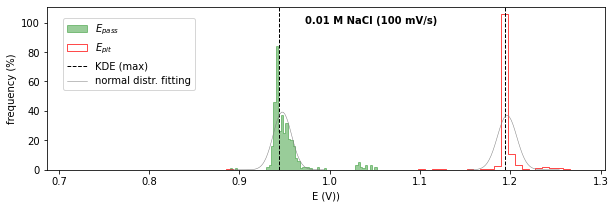

In [80]:
unique_pass=np.unique(pit_pass_log_001_100['Epass_x']) 
unique_pit=np.unique(pit_pass_log_001_100['Epit_x']) 
bins_pass=len(unique_pass)
bins_pit=len(unique_pit)

fig, ax = plt.subplots(figsize=(10,3))

ax.hist(pit_pass_log_001_100['Epass_x'],density=True,bins=bins_pass,color="green",fill=True,histtype='step',alpha=0.4,label="$E_{pass}$")
ax.hist(pit_pass_log_001_100['Epit_x'], density=True,bins=bins_pit,color="red",fill=False,histtype='step',linewidth=0.7,label="$E_{pit}$")

ax.axvline(x = Epass_x_kde,color = 'k',linestyle = 'dashed',linewidth = 1,zorder=2,label="KDE (max)")
ax.axvline(x = Epit_x_kde,color = 'k',linestyle = 'dashed',linewidth = 1,zorder=2)

ax.set_xlabel("E (V))")
ax.set_ylabel("frequency (%)")
ax.set_xlim(0.687,1.305)
ax.set_title("0.01 M NaCl (100 mV/s)",fontsize = 10, y=0.86,x=0.58,weight='bold') 

#without outliers
Epass_sortwo=np.sort(df_not_in_listpass.dropna())
xpass=np.linspace(Epass_sortwo[0],Epass_sortwo[-1],len(unique_pass)) 
dist = distfit(distr="norm",smooth=20,bins=round(len(unique_pass)/2)) 
dist.fit_transform(Epass_sortwo, verbose=1)  
print(dist.model['name']+" RSS: "+str(dist.model['score'])) 
model=norm.pdf(xpass, dist.model['params'][0],dist.model['params'][1])
ax.plot(xpass,model,"grey",linewidth=0.5,label="normal distr. fitting")

Epit_sortwo=np.sort(df_not_in_listpit.dropna())
xpit=np.linspace(Epit_sortwo[0],Epit_sortwo[-1],len(unique_pit)) 
dist = distfit(distr="norm",smooth=20,bins=round(len(unique_pit)/2)) 
dist.fit_transform(Epit_sortwo, verbose=1)  
print(dist.model['name']+" RSS: "+str(dist.model['score'])) 
model=norm.pdf(xpit, dist.model['params'][0],dist.model['params'][1])
ax.plot(xpit,model,"grey",linewidth=0.5)

fig.legend(loc="upper left", bbox_to_anchor=(0.14, 0.85))

### plotting histograms of Epit_y and Epass_y (log(jpit) and log(jpass) (µA/cm²))

Text(0.55, 0.96, '0.01 M NaCl (100 mV/s)')

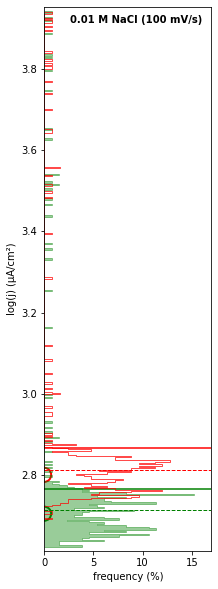

In [53]:
unique_pass=np.unique(pit_pass_log_001_100['Epass_y']) 
unique_pit=np.unique(pit_pass_log_001_100['Epit_y']) 
bins_pass=len(unique_pass)
bins_pit=len(unique_pit)

fig, ax = plt.subplots(figsize=(3,10))

ax.hist(pit_pass_log_001_100['Epass_y'],density=True,bins=bins_pass,color="green",fill=True,histtype='step',alpha=0.4,orientation="horizontal",label="$E_{pass}$")
ax.axhline(y = Epass_y_mean, color = 'green', linewidth = 1.5,zorder=2,label="mean")
ax.axhline(y = Epass_y_median, color = 'green',linestyle = 'dashed',linewidth = 1,zorder=2,label="median")

ax.hist(pit_pass_log_001_100['Epit_y'],density=True,bins=bins_pit,color="red",fill=False,histtype='step',linewidth=0.7,orientation="horizontal",label="$E_{pit}$")
ax.axhline(y = Epit_y_mean, color = 'red', linewidth = 1.5,zorder=2,label="mean")
ax.axhline(y = Epit_y_median, color = 'red',linestyle = 'dashed',linewidth = 1,zorder=2,label="median")

ax.scatter(0,Epass_y_kde,marker="o",s=200,facecolors='none',edgecolors="g",linewidth=2)
ax.scatter(0,Epit_y_kde,marker="o",s=200,facecolors='none',edgecolors="r",linewidth=2)

ax.set_ylabel("log(j) (µA/cm²)")
ax.set_xlabel("frequency (%)")
ax.set_ylim(min(pit_pass_log_001_100['Epass_y'])-0.01,max(pit_pass_log_001_100['Epass_y'])+0.01) 
ax.set_xlim(0,17) 
ax.set_title("0.01 M NaCl (100 mV/s)",fontsize = 10, y=0.96,x=0.55,weight='bold') 

In [25]:
jpass_sort=np.sort(pit_pass_log_001_100['Epass_y'].dropna())
jpit_sort=np.sort(pit_pass_log_001_100['Epit_y'].dropna())

### hypothesis testing
#### null hypothesis 1: the Epass (V) is normally distributed
#### null hypothesis 2: the Epit (V) is normally distributed

Since the p-value is less than 0.05, we reject the null hypothesis. 
We have sufficient evidence to say that the sample data does not come from a normal distribution.

Since the p-value is not less than 0.05, we fail to reject the null hypothesis. 
We do not have sufficient evidence to say that the sample data does not come from a normal distribution.

#### normality tests

In [56]:
from scipy.stats import shapiro, normaltest, anderson

def test_normality(data, hypothesis_num):
    # Shapiro-Wilk Test
    stat, p = shapiro(data)
    print(f"p={p:.3f}")
    if p < 0.05:
        print(f"The null hypothesis {hypothesis_num} can be rejected")
    else:
        print(f"The null hypothesis {hypothesis_num} cannot be rejected: normal distribution")

    # D'Agostino and Pearson's Test
    stat, p = normaltest(data)
    print(f"p={p:.3f}")
    if p < 0.05:
        print(f"The null hypothesis {hypothesis_num} can be rejected")
    else:
        print(f"The null hypothesis {hypothesis_num} cannot be rejected: normal distribution")
    
    # Anderson-Darling Test
    result = anderson(data)
    for i in range(len(result.critical_values)):
        slevel, cvalues = result.significance_level[i], result.critical_values[i]
        if result.statistic < result.critical_values[i]:
            print(f'{slevel:.3f}: {cvalues:.3f}, data looks normal (fail to reject H0)')
        else:
            print(f'{slevel:.3f}: {cvalues:.3f}, data does not look normal (reject H0)')

# Testing normality for Epass_sort and Epit_sort
print("Epass")
test_normality(Epass_sort, 1)
print("\nEpit")
test_normality(Epit_sort, 2)

# Testing normality for Epass_sortwo and Epit_sortwo (without outliers)
print("\nEpass w/o outliers")
test_normality(Epass_sortwo, 1)
print("\nEpit w/o outliers")
test_normality(Epit_sortwo, 2)

Epass
p=0.000
The null hypothesis 1 can be rejected
p=0.000
The null hypothesis 1 can be rejected
15.000: 0.570, data does not look normal (reject H0)
10.000: 0.649, data does not look normal (reject H0)
5.000: 0.779, data does not look normal (reject H0)
2.500: 0.908, data does not look normal (reject H0)
1.000: 1.081, data does not look normal (reject H0)

Epit
p=0.000
The null hypothesis 2 can be rejected
p=0.000
The null hypothesis 2 can be rejected
15.000: 0.570, data does not look normal (reject H0)
10.000: 0.649, data does not look normal (reject H0)
5.000: 0.779, data does not look normal (reject H0)
2.500: 0.909, data does not look normal (reject H0)
1.000: 1.081, data does not look normal (reject H0)

Epass w/o outliers
p=0.000
The null hypothesis 1 can be rejected
p=0.000
The null hypothesis 1 can be rejected
15.000: 0.570, data does not look normal (reject H0)
10.000: 0.649, data does not look normal (reject H0)
5.000: 0.778, data does not look normal (reject H0)
2.500: 0.9

### mean, IQR and selected quantiles for the log(j) distributions 

In [37]:
# mean of log(j)
m=df_001_100_log.mean(axis=1) 

quantile_min=np.nanpercentile(df_001_100_log, 0.35,axis=1) 
Q1=np.nanpercentile(df_001_100_log,25,axis=1)
median=np.nanpercentile(df_001_100_log,50,axis=1)
Q3=np.nanpercentile(df_001_100_log,75,axis=1)
quantile_max=np.nanpercentile(df_001_100_log, 99.65,axis=1) 
IQR=pd.DataFrame({"Qmin":quantile_min,"Q1":Q1,"median":median,"Q3":Q3,"Qmax":quantile_max,"mean":m}) 
IQR

,Qmin,Q1,median,Q3,Qmax,mean
0,2.000494,2.133541,2.191533,2.217862,2.753002,2.198280
1,1.987413,2.133541,2.163505,2.217862,2.700754,2.195653
2,2.028806,2.133541,2.191533,2.217862,2.758265,2.197524
3,2.028806,2.133541,2.191533,2.217862,2.725306,2.194997
4,2.000494,2.133541,2.191533,2.217862,2.734011,2.201689
...,...,...,...,...,...,...
1103,3.580257,3.791553,3.863053,3.919887,5.088140,3.931386
1104,3.576897,3.796973,3.870507,3.925933,5.095529,3.938374
1105,3.588956,3.802991,3.876715,3.933374,5.102517,3.945068
1106,3.590339,3.812190,3.885041,3.940206,5.107961,3.952844


#### smoothing the IQR values of log(j) 

In [50]:
IQR_ylow_log = IQR.copy()

column_names =  IQR.columns
for index, column in enumerate(column_names):
        
    lowess = sm.nonparametric.lowess
    ylow = lowess(IQR[column],E,frac= 0.15,return_sorted=False)
    IQR_ylow_log[column]=ylow
    
IQR_ylow_log

,Qmin,Q1,median,Q3,Qmax,mean
0,2.002854,2.131502,2.181893,2.217921,2.728437,2.193674
1,2.004168,2.132519,2.182709,2.218812,2.730390,2.194633
2,2.005043,2.133196,2.183254,2.219406,2.731691,2.195272
3,2.006357,2.134213,2.184071,2.220296,2.733642,2.196231
4,2.007232,2.134890,2.184615,2.220890,2.734942,2.196871
...,...,...,...,...,...,...
1103,3.584925,3.784827,3.859333,3.913275,5.097966,3.927663
1104,3.588400,3.789455,3.864161,3.918251,5.103497,3.932590
1105,3.593611,3.796399,3.871406,3.925718,5.111792,3.939982
1106,3.597084,3.801029,3.876238,3.930697,5.117322,3.944911


### plotting the KDE of Epit/log(jpit) and Epass/log(jpass) with selected quantile curves of log(j)

In [59]:
# further smoothing the log(j) curves for improved visualization of the Qmax curve in the KDE plots below 
IQR_ylow01_log = IQR.copy()

column_names =  IQR.columns
for index, column in enumerate(column_names):
        
    lowess = sm.nonparametric.lowess
    ylow = lowess(IQR[column],E,frac= 0.1,return_sorted=False)
    IQR_ylow01_log[column]=ylow

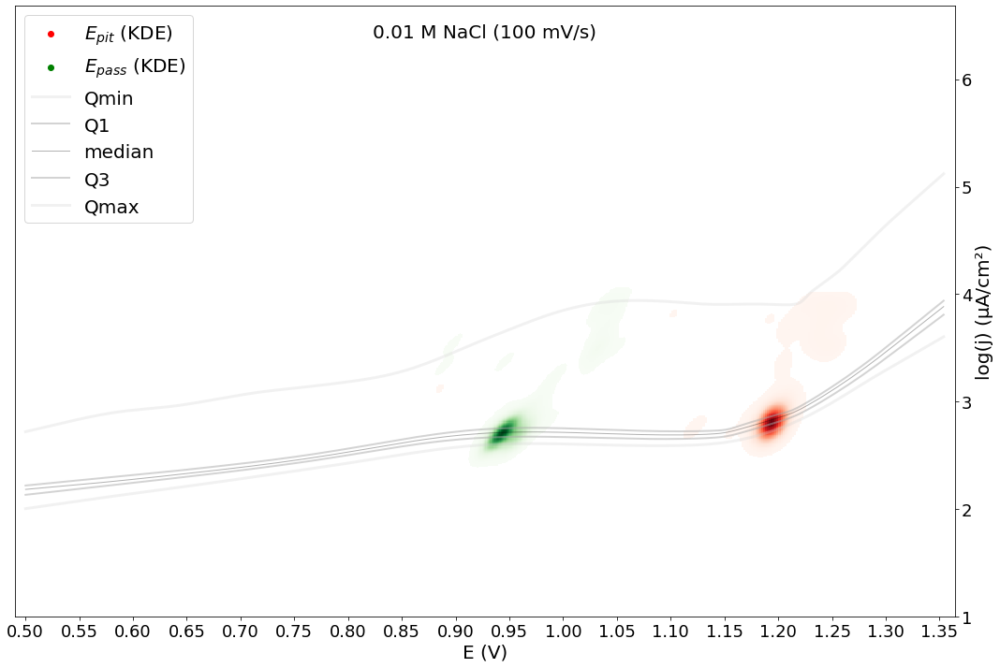

In [61]:
nbins= 300
nbinspass=300

k = kde.gaussian_kde([pit_pass_log_001_100["Epit_x"],pit_pass_log_001_100["Epit_y"]])
xipit, yipit = np.mgrid[pit_pass_log_001_100["Epit_x"].min()-0.08:pit_pass_log_001_100["Epit_x"].max()+0.08:nbins*1j, pit_pass_log_001_100["Epit_y"].min()-0.8:pit_pass_log_001_100["Epit_y"].max()+0.08:nbins*1j]
zipit = k(np.vstack([xipit.flatten(), yipit.flatten()]))
z = np.ma.masked_array(zipit, zipit < 0.6)

k2 = kde.gaussian_kde([pit_pass_log_001_100["Epass_x"].dropna(),pit_pass_log_001_100["Epass_y"].dropna()])
xipass, yipass = np.mgrid[pit_pass_log_001_100["Epass_x"].min()-0.08:pit_pass_log_001_100["Epass_x"].max()+0.08:nbinspass*1j, pit_pass_log_001_100["Epass_y"].min()-0.8:pit_pass_log_001_100["Epass_y"].max()+0.8:nbins*1j]
zipass = k2(np.vstack([xipass.flatten(), yipass.flatten()]))
z2 = np.ma.masked_array(zipass, zipass < 0.6)

fig, ax = plt.subplots(figsize=(18, 12))
plt.pcolormesh(xipit, yipit, z.reshape(xipit.shape), shading='auto',cmap="Reds")
plt.pcolormesh(xipass, yipass, z2.reshape(xipass.shape), shading='auto',cmap="Greens")

ax.scatter(0,0,color="red",label="$E_{pit}$ (KDE)") # plot for the sake of the legend label
ax.scatter(0,0,color="green",label="$E_{pass}$ (KDE)") # plot for the sake of the legend label

ax.plot(E , IQR_ylow_log["Qmin"],color="lightgrey",linewidth=3,label="Qmin",alpha=0.3,zorder=1)    
ax.plot(E , IQR_ylow_log["Q1"], color="darkgray",linewidth=2,label="Q1",alpha=0.5,zorder=1) 
ax.plot(E , IQR_ylow_log["median"], color="k",linewidth=1,label="median",alpha=0.3,zorder=1) 
ax.plot(E , IQR_ylow_log["Q3"],color="darkgray",linewidth=2,label="Q3",alpha=0.5,zorder=1) 
ax.plot(E , IQR_ylow01_log["Qmax"], color="lightgrey",linewidth=3,label="Qmax",alpha=0.3,zorder=1) 

ax.legend( loc ="upper left",prop={'size': 20})
ax.set_ylabel("log(j) (µA/cm²)")
ax.set_xlabel("E (V)")
ax.tick_params(axis='both', which='major', labelsize=18)
ax.xaxis.label.set_size(20)
ax.yaxis.label.set_size(20)

ax.set_xticks(np.arange(0.5,1.3544115,0.05)) 
ax.set_xlim(0.5-0.01,1.3544115+0.01) 
ax.set_ylim(np.log10(10), np.log10(4800000)) 

ax.set_title("0.01 M NaCl (100 mV/s)",fontsize = 20, y=0.94)
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

## Epit and Epass estimations from the IQR and selected quantiles

### Epass

C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
C:\Users\lbertolu\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py:582: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.


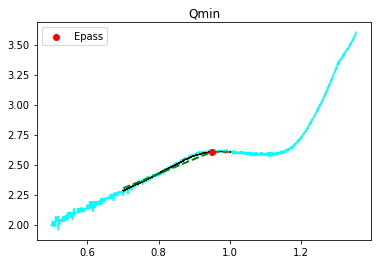

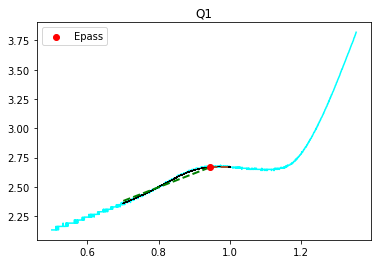

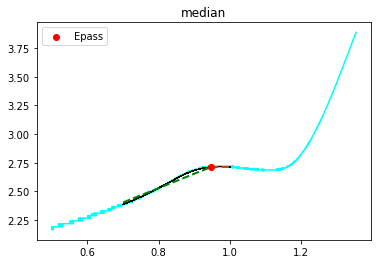

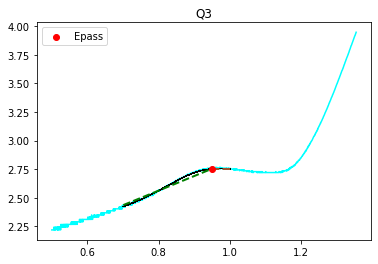

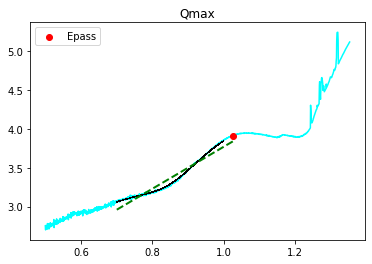

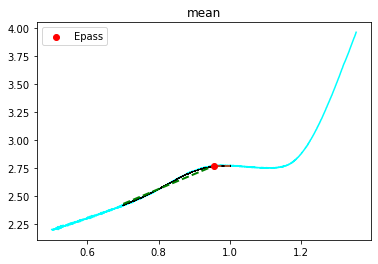

In [53]:
# for avoiding Warnings
plt.rcParams.update({'figure.max_open_warning': 0})

column_names =  IQR.columns

#collect all of the slopes and intercepts for the two parts
XIQR_pass_E, XIQR_pass_j = [],[]

#initialise the two models for part 1 and part 2
model1 = LinearRegression()
model2 = LinearRegression()

for (index, column) in enumerate(column_names):
    fig, ax = plt.subplots() 
    
    ax.plot(E , IQR[column], color = "cyan",zorder=1)

    ax.set_title(column)

    #initialise the r2 values
    r2_final1 = 0
    r2_final2 = 0
    
    limits_pass = range(interval_lower_ipass,interval_upper_ipass+1,1)

    for limit in limits_pass:

        ax.plot(E.iloc[limits_pass[0]:limits_pass[-1]+1],IQR_ylow_log[column].iloc[limits_pass[0]:limits_pass[-1]+1], color = "black",linewidth=0.5,zorder=2) # ylow

         #split the data into the first part and second part
        dfE_1 =  E.iloc[limits_pass[0]:limit+1]
        dfE_2 =  E.iloc[limit:limits_pass[-1]+1] 
        dfj_1 =  IQR_ylow_log.iloc[limits_pass[0]:limit+1] 
        dfj_2 =  IQR_ylow_log.iloc[limit:limits_pass[-1]+1] 
        X1 = dfE_1.values.reshape(-1, 1)
        X2 = dfE_2.values.reshape(-1, 1) 
        y1 = dfj_1[column].values.reshape(-1, 1)
        y2 = dfj_2[column].values.reshape(-1, 1) 

    #fit two regression models on the different parts
        regr1 = model1.fit(X1, y1) 
        regr2 = model2.fit(X2, y2)

    # predict data using a first order linear regression
        y_pred1 = regr1.predict(X1)
        y_pred2 = regr2.predict(X2)

    #check how well the data fits on the training data
        r2_score1 = r2_score(y1, y_pred1) 
        r2_score2 = r2_score(y2, y_pred2)

    #find the best r2 for the different limits (and selecting final: y-hat, df, regr)
        if r2_score1 > r2_final1: 
            r2_final1 = r2_score1
            regr_final1 = regr1

        if r2_score2 > r2_final2: 
            r2_final2 = r2_score2
            regr_final2 = regr2

#find the intersection point for each column
    a1 = regr_final1.coef_[0]
    a2 = regr_final2.coef_[0]
    b1 = regr_final1.intercept_
    b2 = regr_final2.intercept_

    x_intersect = np.around((b1-b2)/(a2-a1),3) # x value
    E_tempo=E.round(3)
    try:
        xi=E_tempo[E_tempo<=x_intersect.item()].index[-1]
    except:
        xi=E_tempo[E_tempo>=x_intersect.item()].index[0]

    try:
#plot the graps to where the interstion point lays, in other words change the limit to that value
        x1_reg=E.iloc[limits_pass[0]:xi+1]
        x2_reg=E.iloc[xi:limits_pass[-1]+1]
        y1_reg = x1_reg*a1 + b1
        y2_reg = x2_reg*a2 + b2      

        ax.plot(x1_reg, y1_reg, linewidth = 2, color = 'green', linestyle = 'dashed')
        ax.plot(x2_reg, y2_reg, linewidth = 2, color = 'sienna', linestyle = 'dashed')

        ax.scatter(E.iloc[xi],IQR_ylow_log[column].iloc[xi],color="red",zorder=3,label="Epass")                   
        ax.legend()

        XIQR_pass_E.append(E.iloc[xi])
        XIQR_pass_j.append(IQR_ylow_log[column].iloc[xi])        
    except:
        print(column)

### Epit

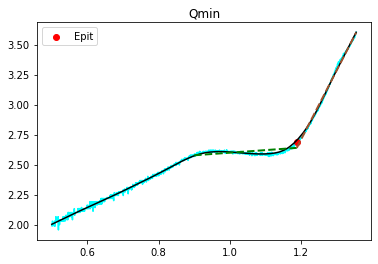

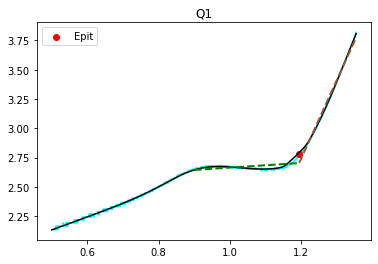

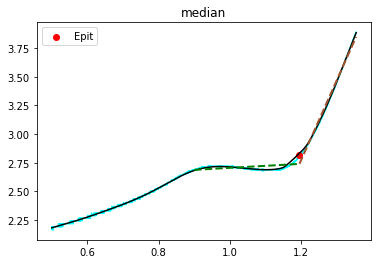

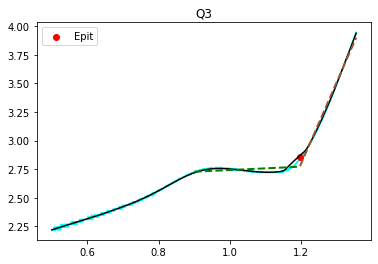

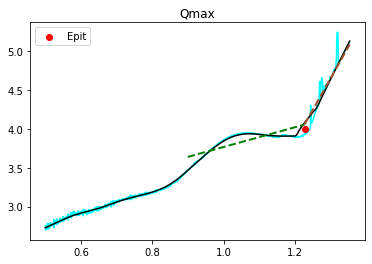

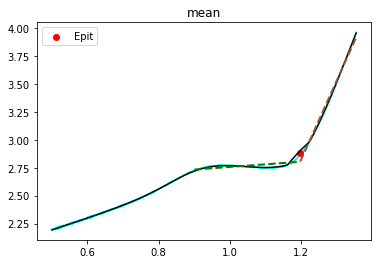

In [51]:
# for avoiding Warnings
plt.rcParams.update({'figure.max_open_warning': 0})

column_names =  IQR.columns

#collect all of the slopes and intercepts for the two parts
XIQR_pit_E, XIQR_pit_j = [],[]

#initialise the two models for part 1 and part 2
model1 = LinearRegression()
model2 = LinearRegression()

for index, column in enumerate(column_names):
    fig, ax = plt.subplots() 
    
    ax.plot(E , IQR[column], color = "cyan",zorder=1)
    ax.set_title(column)

    #initialise the r2 values
    r2_final1 = 0
    r2_final2 = 0
    
    limits_pit = range(interval_lower_i,interval_upper_i+1,1) 
    Epass_estimated=Epass_estimated_i
     #   pass
        
    for limit in limits_pit:
        
        #split the data into the first part and second part
        dfE_1 =  E.iloc[Epass_estimated:limit+1]
        dfE_2 =  E.iloc[limit:]
        dfj_1 =  IQR_ylow_log.iloc[Epass_estimated:limit+1]
        dfj_2 =  IQR_ylow_log.iloc[limit:]
        
        X1 = dfE_1.values.reshape(-1, 1)
        X2 = dfE_2.values.reshape(-1, 1)
        y1 = dfj_1[column].values.reshape(-1, 1)
        y2 = dfj_2[column].values.reshape(-1, 1)

        #fit two regression models on the different parts
        regr1 = model1.fit(X1, y1) 
        regr2 = model2.fit(X2, y2)

        # predict data using a first order linear regression
        y_pred1 = regr1.predict(X1)
        y_pred2 = regr2.predict(X2)
        
        #check how well the data fits on the training data
        r2_score1 = r2_score(y1, y_pred1) 
        r2_score2 = r2_score(y2, y_pred2)
        
        #find the best r2 for the different limits 
        if r2_score1 > r2_final1: 
            r2_final1 = r2_score1
            regr_final1 = regr1
                    
        if r2_score2 > r2_final2: 
            r2_final2 = r2_score2
            regr_final2 = regr2
            
    #find the intersection point for each column
    a1 = regr_final1.coef_[0]
    a2 = regr_final2.coef_[0]
    b1 = regr_final1.intercept_
    b2 = regr_final2.intercept_

    x_intersect = np.around((b1-b2)/(a2-a1),3) # x value
    E_tempo=E.round(3)
    try:
        xi=E_tempo[E_tempo<=x_intersect.item()].index[-1]
    except:
        xi=E_tempo[E_tempo>=x_intersect.item()].index[0]

    try:
        #plot the graphs to where the interstion point lays, in other words change the limit to that value
        ax.plot(E , IQR_ylow_log[column], color = "black",zorder=2)
        x1_reg=E.iloc[Epass_estimated:xi+1]
        x2_reg=E.iloc[xi:]
        y1_reg = x1_reg*a1 + b1
        y2_reg = x2_reg*a2 + b2

        ax.plot(x1_reg, y1_reg, linewidth = 2, color = 'green', linestyle = 'dashed')
        ax.plot(x2_reg, y2_reg, linewidth = 2, color = 'sienna', linestyle = 'dashed')
        ax.scatter(E.iloc[xi],np.mean([IQR[column].iloc[xi],IQR_ylow_log[column].iloc[xi]]),color="red",label="Epit")
        ax.legend()
                
        XIQR_pit_E.append(E.iloc[xi])
        XIQR_pit_j.append(np.mean([IQR[column].iloc[xi],IQR_ylow_log[column].iloc[xi]]))
            
    except: 
        print(column)

#### storing the Epit (x,y) and Epass (x,y) values of the IQR curves in a df 

In [54]:
pit_pass_001_100_IQR = pd.DataFrame({"Epit_x":XIQR_pit_E,"Epit_y":XIQR_pit_j,"Epass_x":XIQR_pass_E,"Epass_y":XIQR_pass_j})
pit_pass_001_100_IQR.index=IQR.columns
pit_pass_001_100_IQR.index.name="IQR"
pit_pass_001_100_IQR

,Epit_x,Epit_y,Epass_x,Epass_y
IQR,,,,
Qmin,1.187170,2.689817,0.948210,2.605767
Q1,1.194189,2.779519,0.945158,2.670046
median,1.194800,2.819698,0.947295,2.713066
Q3,1.196325,2.854733,0.948210,2.752232
Qmax,1.227454,4.002487,1.026948,3.900831
mean,1.197241,2.885169,0.955229,2.762129


## central tendency estimates of Epass/log(jpass) and Epit/log(jpit)
### comparison of estimates from the maximum KDE (ground truth) with the median and mean proxy models

In [39]:
#median absolute deviation 
from scipy.stats import median_abs_deviation

df_mad=median_abs_deviation(df_001_100_log,axis=1)

Text(0.5, 1.0, '0.01 M NaCl (100 mV/s)')

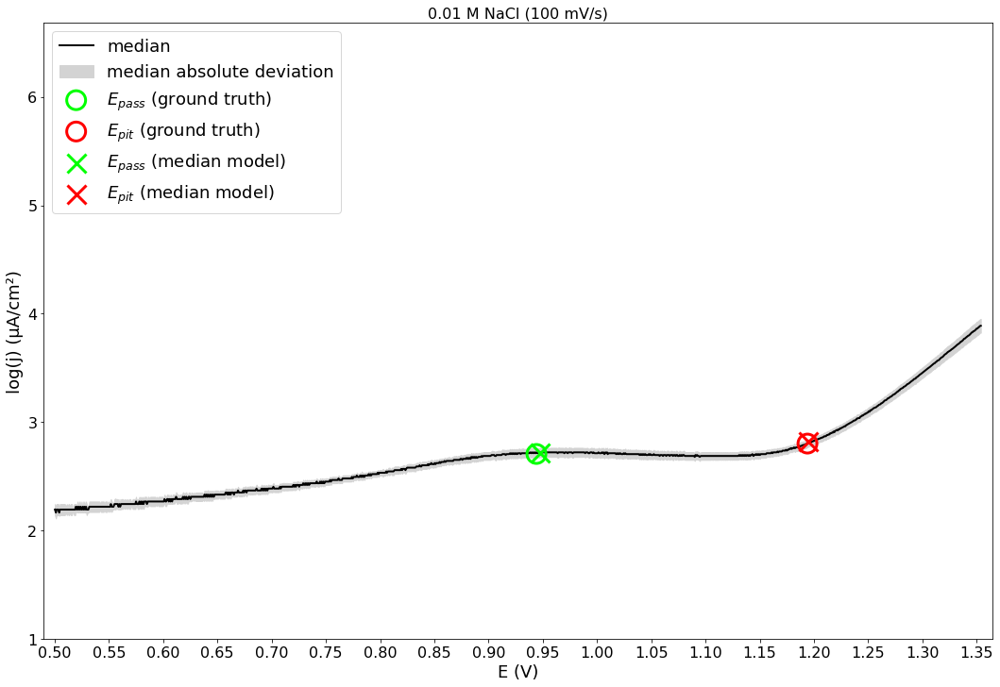

In [55]:
fig, ax = plt.subplots(figsize=(18, 12))

ax.plot(E,IQR["median"], color="k",linewidth=2,label="median")
ax.fill_between(E, IQR["median"]-df_mad, IQR["median"]+df_mad,color="lightgrey",label="median absolute deviation")

ax.scatter(Epass_x_kde,Epass_y_kde,marker="o",facecolors='none',edgecolors="lime",s=400,label="$E_{pass}$ (ground truth)",linewidths=3,zorder=2)
ax.scatter(Epit_x_kde,Epit_y_kde,marker="o",facecolors='none',edgecolors="r",s=400,label="$E_{pit}$ (ground truth)",linewidths=3,zorder=2)

ax.scatter(pit_pass_001_100_IQR.loc["median"]["Epass_x"],pit_pass_001_100_IQR.loc["median"]["Epass_y"],marker="x",c="lime",s=400,label="$E_{pass}$ (median model)",linewidths=3,zorder=2)
ax.scatter(pit_pass_001_100_IQR.loc["median"]["Epit_x"],pit_pass_001_100_IQR.loc["median"]["Epit_y"],marker="x",c="red",s=400,label="$E_{pit}$ (median model)",linewidths=3,zorder=2)

ax.legend( loc ="upper left",prop={'size': 18})
ax.set_ylabel("log(j) (µA/cm²)")
ax.set_xlabel("E (V)")
ax.tick_params(axis='both', which='major', labelsize=16)
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)

ax.set_xticks(np.arange(0.5,1.3544115,0.05)) 
ax.set_xlim(0.5-0.01,1.3544115+0.01) 
ax.set_ylim(np.log10(10), np.log10(4800000)) 

ax.set_title("0.01 M NaCl (100 mV/s)",fontsize = 16)

In [56]:
#standard deviation 
df_std=np.std(df_001_100_log,axis=1)
    
#standard error of the mean 
from scipy.stats import sem
df_sem=sem(df_001_100_log,axis=1)

Text(0.5, 1.0, '0.01 M NaCl (100 mV/s)')

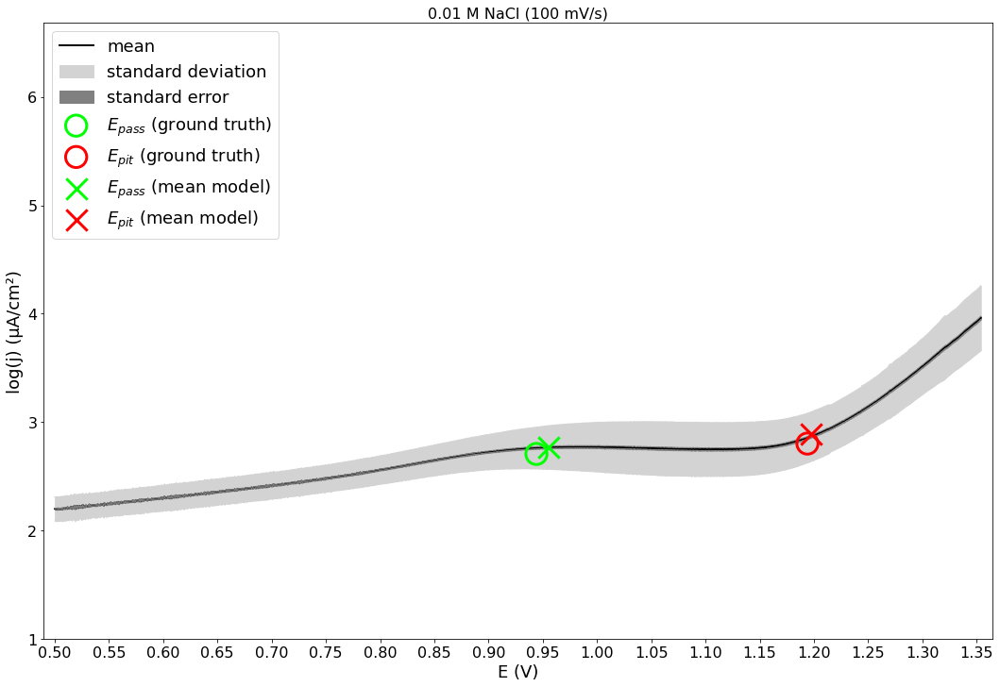

In [57]:
fig, ax = plt.subplots(figsize=(18, 12))
ax.plot(E,m, color="k",linewidth=2,label="mean")

ax.plot(E,m+df_std, color="lightgrey",linewidth=1)
ax.plot(E,m-df_std, color="lightgrey",linewidth=1)
ax.fill_between(E,  m-df_std, m+df_std,color="lightgrey",label="standard deviation")

ax.plot(E,m+df_sem, color="grey",linewidth=1)
ax.plot(E,m-df_sem, color="grey",linewidth=1)
ax.fill_between(E, m-df_sem, m+df_sem,color="grey",label="standard error")

ax.scatter(Epass_x_kde,Epass_y_kde,marker="o",facecolors='none',edgecolors="lime",s=500,label="$E_{pass}$ (ground truth)",linewidths=3,zorder=2)
ax.scatter(Epit_x_kde,Epit_y_kde,marker="o",facecolors='none',edgecolors="r",s=500,label="$E_{pit}$ (ground truth)",linewidths=3,zorder=2)

ax.scatter(pit_pass_001_100_IQR.loc["mean"]["Epass_x"],pit_pass_001_100_IQR.loc["mean"]["Epass_y"],marker="x",c="lime",s=500,label="$E_{pass}$ (mean model)",linewidths=3,zorder=2)
ax.scatter(pit_pass_001_100_IQR.loc["mean"]["Epit_x"],pit_pass_001_100_IQR.loc["mean"]["Epit_y"],marker="x",c="red",s=500,label="$E_{pit}$ (mean model)",linewidths=3,zorder=2)

ax.legend( loc ="upper left",prop={'size': 18})
ax.set_ylabel("log(j) (µA/cm²)")
ax.set_xlabel("E (V)")
ax.tick_params(axis='both', which='major', labelsize=16)
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)

ax.set_xticks(np.arange(0.5,1.3544115,0.05)) 
ax.set_xlim(0.5-0.01,1.3544115+0.01) 
ax.set_ylim(np.log10(10), np.log10(4800000)) 

ax.set_title("0.01 M NaCl (100 mV/s)",fontsize = 16)

### storing the ground truth values of Epass/log(jpass) and Epit/log(jpit) and the mean-/median-based estimates in a df (and exporting it as a CSV file)

In [72]:
residuals_mean_median = pd.DataFrame(
[[Epass_x_kde,
Epass_y_kde,
Epit_x_kde,
Epit_y_kde,
pit_pass_001_100_IQR.loc["median"]["Epass_x"],
pit_pass_001_100_IQR.loc["median"]["Epass_y"],
pit_pass_001_100_IQR.loc["median"]["Epit_x"],
pit_pass_001_100_IQR.loc["median"]["Epit_y"],
pit_pass_001_100_IQR.loc["mean"]["Epass_x"],
pit_pass_001_100_IQR.loc["mean"]["Epass_y"],
pit_pass_001_100_IQR.loc["mean"]["Epit_x"],
pit_pass_001_100_IQR.loc["mean"]["Epit_y"],
Epass_x_kde-pit_pass_001_100_IQR.loc["median"]["Epass_x"], # computing residuals of estimation
Epass_y_kde-pit_pass_001_100_IQR.loc["median"]["Epass_y"],
Epit_x_kde-pit_pass_001_100_IQR.loc["median"]["Epit_x"],
Epit_y_kde-pit_pass_001_100_IQR.loc["median"]["Epit_y"],
Epass_x_kde-pit_pass_001_100_IQR.loc["mean"]["Epass_x"],
Epass_y_kde-pit_pass_001_100_IQR.loc["mean"]["Epass_y"],
Epit_x_kde-pit_pass_001_100_IQR.loc["mean"]["Epit_x"],
Epit_y_kde-pit_pass_001_100_IQR.loc["mean"]["Epit_y"]]], 
columns=["Epass","jpass","Epit","jpit",
        'median Epass','median jpass','median Epit','median jpit','mean Epass','mean jpass','mean Epit','mean jpit',
        'median Epass res','median jpass res','median Epit res','median jpit res','mean Epass res','mean jpass res','mean Epit res','mean jpit res'],
index=[1])
# choosing the directory 
os.chdir(r"C:\Users\lbertolu\OneDrive - Vrije Universiteit Brussel\ULB\SECCM tests\pitting statistics paper draft\pape2")
residuals_mean_median.to_csv('residuals_mean_median_001_100.csv', index=True)
residuals_mean_median

,Epass,jpass,Epit,jpit,median Epass,median jpass,median Epit,median jpit,mean Epass,mean jpass,mean Epit,mean jpit,median Epass res,median jpass res,median Epit res,median jpit res,mean Epass res,mean jpass res,mean Epit res,mean jpit res
1,0.944126,2.704908,1.193988,2.800571,0.947295,2.713066,1.1948,2.819698,0.955229,2.762129,1.197241,2.885169,-0.003168,-0.008159,-0.000812,-0.019126,-0.011103,-0.057222,-0.003253,-0.084598
